In [2]:
# Plots scatter distance Vs avg_speed W/ dep_delay as bubble
import matplotlib.pyplot as plt
from scipy import stats
import pandas as pd
import plotly.express as px
import numpy as np

In [3]:
flights = pd.read_csv("data/flights_no_outlier_iqr_time.csv")

In [4]:
data = flights[['fl_date','origin_airport_id','origin_city_name','dest_airport_id','dest_city_name','dep_delay','arr_delay','air_time','distance']]
data.head()

,fl_date,origin_airport_id,origin_city_name,dest_airport_id,dest_city_name,dep_delay,arr_delay,air_time,distance
0,2019-05-22,11433,"Detroit, MI",10721,"Boston, MA",-2.0,-16.0,82.0,632
1,2019-06-27,12953,"New York, NY",11057,"Charlotte, NC",2.0,-12.0,81.0,544
2,2018-04-05,11292,"Denver, CO",10713,"Boise, ID",-2.0,-17.0,105.0,649
3,2019-02-08,10821,"Baltimore, MD",11042,"Cleveland, OH",23.0,17.0,58.0,314
4,2019-02-23,11146,"Charleston/Dunbar, WV",11057,"Charlotte, NC",-7.0,-4.0,56.0,221


In [5]:
dist = data['distance']
tyme = data['air_time']
data['avg_speed'] = dist/tyme*60
data.head()

<ipython-input-5-1cd79dd1e4e3>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['avg_speed'] = dist/tyme*60


,fl_date,origin_airport_id,origin_city_name,dest_airport_id,dest_city_name,dep_delay,arr_delay,air_time,distance,avg_speed
0,2019-05-22,11433,"Detroit, MI",10721,"Boston, MA",-2.0,-16.0,82.0,632,462.439024
1,2019-06-27,12953,"New York, NY",11057,"Charlotte, NC",2.0,-12.0,81.0,544,402.962963
2,2018-04-05,11292,"Denver, CO",10713,"Boise, ID",-2.0,-17.0,105.0,649,370.857143
3,2019-02-08,10821,"Baltimore, MD",11042,"Cleveland, OH",23.0,17.0,58.0,314,324.827586
4,2019-02-23,11146,"Charleston/Dunbar, WV",11057,"Charlotte, NC",-7.0,-4.0,56.0,221,236.785714


In [6]:
# Get all flights where there is departure delay > 0
delay_above0speeds = data.loc[(data['dep_delay'] > 0) & (data['dep_delay'].notna()), 'avg_speed']

In [7]:
delay_above0speeds.describe()

count    61912.000000
mean       408.490360
std         73.048045
min        112.941176
25%        364.444444
50%        415.810907
75%        458.333333
max        766.764706
Name: avg_speed, dtype: float64

In [8]:
# Get all flights where departure == 0
delay_0_speeds = data.loc[(data['dep_delay'] == 0) & (data['dep_delay'].notna()), 'avg_speed']

In [9]:
delay_0_speeds.describe()

count    14566.000000
mean       408.723288
std         71.136213
min        114.736842
25%        366.000000
50%        416.160000
75%        457.370717
max        634.796748
Name: avg_speed, dtype: float64

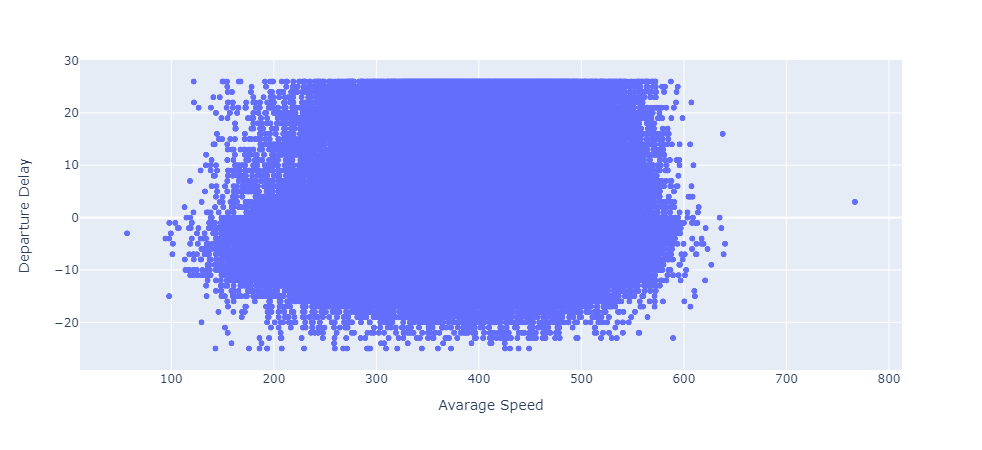

In [10]:
df = px.data.gapminder().query("continent == 'Oceania'")
fig = px.scatter( x = data['avg_speed'], y=data['dep_delay'], labels={'x':'Avarage Speed', 'y':'Departure Delay'})
fig.show()

In [11]:
#remove outliers
def reject_outliers(data, m=3):
    return data[abs(data - np.mean(data)) < m * np.std(data)]

In [12]:
delay_above0speeds_no_ol = reject_outliers(delay_above0speeds, m=3)
delay_0_speeds_no_ol = reject_outliers(delay_0_speeds, m=2)

delay_above0speeds_no_ol.mean(), delay_0_speeds_no_ol.mean()

(409.58141344983545, 414.7862222692234)

In [14]:
from scipy.stats import ttest_ind
# Taking a sample size of 1000 from each
ttest,pval = ttest_ind(delay_above0speeds_no_ol[:10000], delay_zero_speeds_no_ol[:10000])

print("p-value",pval)
if pval <0.05:
  print("Reject null hypothesis")
else:
  print("Accept null hypothesis")

NameError: name 'delay_greater_0_speeds_no_ol' is not defined